# Monte Carlo Approach

## Monte Carlo Simulation

## Option Pricing Techniques

# Simulating Asset Prices

## Generate Price Paths

In [1]:
# Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Set max row to 300
pd.set_option("display.max_rows", 300)

In [2]:
import cufflinks as cf

cf.set_config_file(offline=True, theme="solar", dimensions=((1000, 600)))
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

pio.templates.default = pio.templates["plotly_dark"]

px.defaults.width, px.defaults.height = 1000, 600

## User Defined Function

In [3]:
# define simulation function
def simulate_path(s0, mu, sigma, horizon, timesteps, n_sims):
    # set the seed
    np.random.seed(2023)

    # read the params
    S0 = s0
    r = mu
    T = horizon
    t = timesteps
    n = n_sims

    # define dt
    dt = T / t

    # simulate path
    S = np.zeros((t, n))

    S[0] = S0
    for i in range(0, t - 1):
        w = np.random.standard_normal(n)
        S[i + 1] = S[i] * (1 + r * dt + sigma * np.sqrt(dt) * w)

    return S

## Histogram of Psuedo Random Numbers

In [4]:
# Assign simulated price path to dataframe for analysis and plotting
price_path = pd.DataFrame(simulate_path(100, 0.05, 0.2, 1, 252, 100000))
# Verify the generated price paths
price_path.head()

,0,1,2,3,4,5,6,7,8,9,...,99990,99991,99992,99993,99994,99995,99996,99997,99998,99999
0,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
1,100.916466,99.611029,98.757603,100.317489,99.891132,98.581948,103.364080,101.834833,100.144446,96.087080,...,100.526533,98.860239,98.837148,100.039456,98.913105,99.580159,99.246204,99.383916,98.362717,100.002582
2,101.102047,99.252871,98.060186,100.326270,98.603518,100.717457,104.176433,100.222994,101.468809,95.026936,...,101.555214,97.144692,99.130006,100.251700,97.617909,99.474348,98.328044,100.179019,98.775283,99.668132
3,100.572272,100.383399,98.151705,100.305081,100.957863,101.003838,105.040394,96.817626,100.584172,93.812262,...,100.687368,95.671818,98.864215,100.339384,98.261258,101.356891,97.348343,100.076692,98.885967,98.173543
4,100.103597,100.482743,99.225147,100.341161,100.908313,100.437038,104.973611,96.873934,99.199344,92.857468,...,103.588192,96.954031,100.491272,99.724911,98.236881,100.712394,97.737062,99.770981,97.046760,97.968690


## Histogram of Simulated Paths

In [5]:
# plt.hist(pd.DataFrame(random.standard_normal(100000)), bins=100);
# w = random.standard_normal(100000)
# w.std(), w.mean()

<AxesSubplot: >

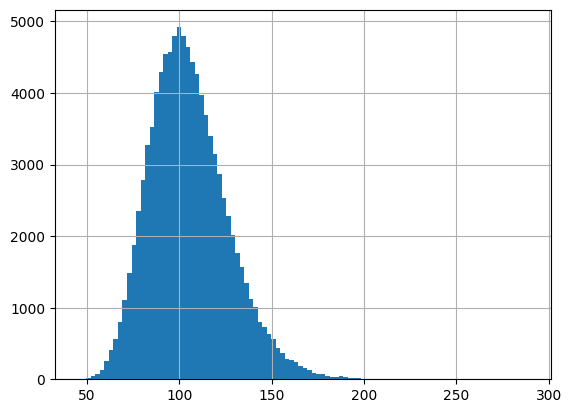

In [6]:
# Plot the histogram of the simulated price path at maturity
price_path.iloc[-1].hist(bins=100)

## Visualization of Simulated Paths

Text(0.5, 1.0, 'Monte Carlo Simulated Asset Prices')

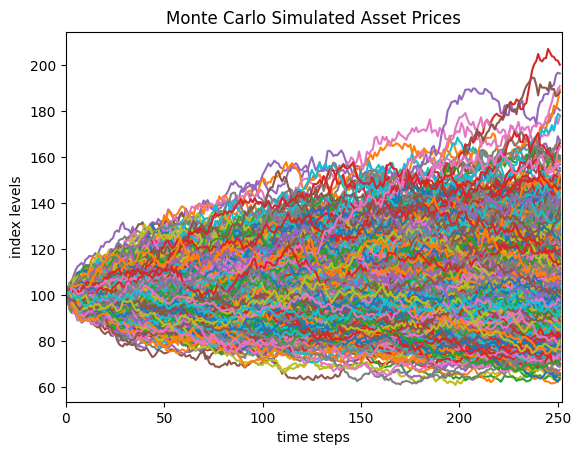

In [7]:
# Plot initial 100 simulated path using matplotlib
plt.plot(price_path.iloc[:, :1000])
plt.xlabel("time steps")
plt.xlim(0, 252)
plt.ylabel("index levels")
plt.title("Monte Carlo Simulated Asset Prices")

In [8]:
N = 1000

ys = price_path.T.sample(N).values.reshape(-1)
xs = np.tile(price_path.index.values, N)

go.Figure(data=[go.Scattergl(x=xs, y=ys, mode="lines", opacity=0.02)]).update_layout(width=700)

# Risk-Neutral Valuation

## European Option

In [9]:
# Call the simulation function
S = simulate_path(100, 0.05, 0.2, 1, 252, 100000)

# Define parameters
K = 100
r = 0.05
T = 1

In [10]:
# Calculate the discounted value of the expected payoff
C0 = np.exp(-r * T) * np.mean(np.maximum(0, S[-1] - K))
P0 = np.exp(-r * T) * np.mean(np.maximum(0, K - S[-1]))
# Print the values
print(f"European Call Option Value is {C0:0.4f}")
print(f"European Put Option Value is {P0:0.4f}")

European Call Option Value is 10.4688
European Put Option Value is 5.5756


Text(0.5, 0.98, 'Option Payoff at Maturity')

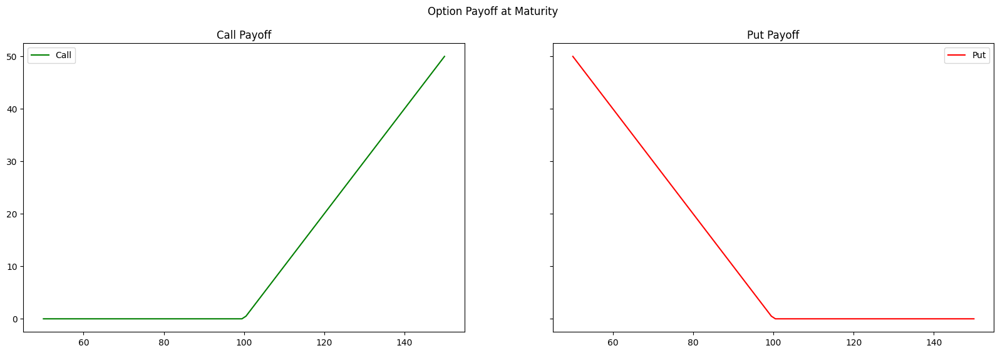

In [11]:
# range of spot prices
sT = np.linspace(50, 150, 100)

# visualize call and put price for range of spot prices
figure, axes = plt.subplots(1, 2, figsize=(20, 6), sharey=True)
title, payoff, color, label = (
    ["Call Payoff", "Put Payoff"],
    [np.maximum(sT - K, 0), np.maximum(K - sT, 0)],
    ["green", "red"],
    ["Call", "Put"],
)

# plot payoff
for i in range(2):
    axes[i].plot(sT, payoff[i], color=color[i], label=label[i])
    axes[i].set_title(title[i])
    axes[i].legend()

figure.suptitle("Option Payoff at Maturity")

## Asian Call Option

An Asian option is an option where the payoff depends on the average price of the underlying asset
over a certain period of time. Averaging can be either be Arithmetic or Geometric. There are two
types of Asian options: fixed strike, where averaging price is used in place of underlying price;
and fixed price, where averaging price is used in place of strike.
We’ll now price a fixed strike arithmetic average option using Monte Carlo simulation.

In [12]:
# Average price
A = S.mean(axis=0)

C0 = np.exp(-r * T) * np.mean(np.maximum(0, A - K))
P0 = np.exp(-r * T) * np.mean(np.maximum(0, K - A))

# Print the values
print(f"Asian Call Option Value is {C0:0.4f}")
print(f"Asian Put Option Value is {P0:0.4f}")

Asian Call Option Value is 5.7777
Asian Put Option Value is 3.3600


## Up-and-out Barrier Call Option

Barrier Options are path dependent exotic options whose payoff depends on whether the price of the underlying asset crosses a pre specified level (called the ‘barrier’) before the expiration. Refer Paul Wilmott on `Quantitative Finance Chapter 23 — Barrier Options` and `Chapter 77 — Finite Difference Methods for One-factor Models` for further details on barriers.

In a paper titled `A Continuity Correction for Discrete Barrier Option, Mark Broadie, Paul Glasserman
and Steven Kou` have shown us that the discrete barrier options can be priced using continuous
barrier formulas by applying a simple continuity correction to the barrier. The correction shifts the
barrier away from the underlying by a factor of
$$e^{\beta \sigma \sqrt{\Delta t}}$$
where $\beta \approx 0.5826$ and $\sigma$ is the underlying volatility, and $\Delta t$ is the time between monitoring instants.
We will apply this continuity correction in our pricing method as well.

In [13]:
# Call the simulation function
S = simulate_path(100, 0.05, 0.2, 1, 252, 100000)

# Define parameters
K = 100
B = 150
r = 0.05
sigma = 0.20
T = 1
t = 252
dt = T / t
n = 100000
rebate = 10
value = 0

# Barrier shift - continuity correction for discrete monitoring
B_shift = B * np.exp(0.5826 * sigma * np.sqrt(dt))
B_shift

# Calculate the discounted value of the expected payoff
for i in range(n):
    if S[:, i].max() < B_shift:
        value += np.maximum(0, S[-1, i] - K)
    else:
        value += rebate

C0 = np.exp(-r * T) * value / n

# Print the values
print(f"Up-and-Out Barrier Call Option Value is {C0:0.4f}")

Up-and-Out Barrier Call Option Value is 8.3939


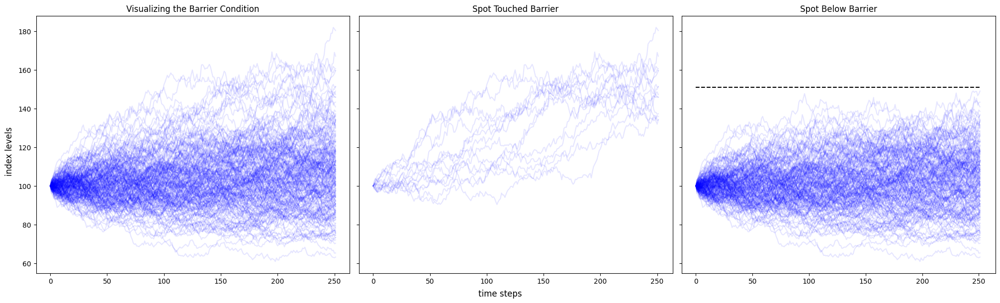

In [14]:
N = 200

figure, axes = plt.subplots(1,3, figsize=(20,6), sharey='row', constrained_layout=True)
figure.align_ylabels()
title = ['Visualizing the Barrier Condition', 'Spot Touched Barrier', 'Spot Below Barrier']
axes[0].plot(S[:,:N], 'blue', alpha=.1)
for i in range(N):
    if S[:,i].max() > B_shift:
        axes[1].plot(S[:,i], 'blue', alpha=.1)  
    else:
        axes[2].plot(S[:,i], 'blue', alpha=.1)

for i in range(3):
    axes[i].set_title(title[i])

axes[i].hlines(B_shift, 0, 252, colors='k', linestyles='dashed')
figure.supxlabel('time steps')
figure.supylabel('index levels')

plt.show()

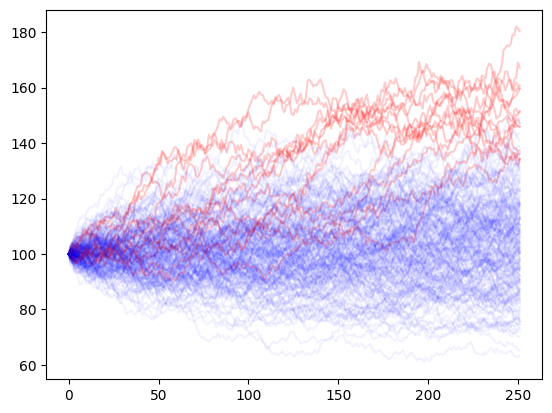

In [15]:
# Plot initial 100 simulated path using matplotlib
axs = plt.gca()
for i in range(N):
    if S[:,i].max() > B_shift:
        axs.plot(S[:,i], 'red', alpha=.2)  
    else:
        axs.plot(S[:,i], 'blue', alpha=.05)